# Blood cell type classification project
The aim of this project is to determine as correctly as possible the blood cell type (label), given the image.

# 1. Exploratory Data Analysis

In [1]:
# Importing the necessary tools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.model_selection import train_test_split
import seaborn as sns

In [2]:
# Labels DataFrame
labels = pd.read_csv("/content/drive/MyDrive/blood-type/dataset-master/dataset-master/labels.csv")

In [3]:
labels.head()

,Unnamed: 0,Image,Category
0,NaN,0,NEUTROPHIL
1,NaN,1,NEUTROPHIL
2,NaN,2,NEUTROPHIL
3,NaN,3,NEUTROPHIL
4,NaN,4,NEUTROPHIL


In [4]:
# General information
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 410 entries, 0 to 409
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      float64
 1   Image       410 non-null    int64  
 2   Category    366 non-null    object 
dtypes: float64(1), int64(1), object(1)
memory usage: 9.7+ KB


In [5]:
# Checking for missing values
labels.isna().sum()

Unnamed: 0    410
Image           0
Category       44
dtype: int64

In [6]:
# Checking the shape
labels.shape

(410, 3)

It seems that we have 44 missing categories. The next step is to clean the data.

In [7]:
# Dropping the "Unnamed: 0" column altogether
labels = labels.drop("Unnamed: 0", axis = 1)
labels

,Image,Category
0,0,NEUTROPHIL
1,1,NEUTROPHIL
2,2,NEUTROPHIL
3,3,NEUTROPHIL
4,4,NEUTROPHIL
...,...,...
405,406,NaN
406,407,NEUTROPHIL
407,408,NEUTROPHIL
408,409,NEUTROPHIL


In [8]:
# Dropping the missing categories
labels = labels.dropna(axis = 0)

# Checking again for missing values
labels.isna().sum()

Image       0
Category    0
dtype: int64

In [9]:
# Checking the DataFrame since all missing values have been cleared
labels

,Image,Category
0,0,NEUTROPHIL
1,1,NEUTROPHIL
2,2,NEUTROPHIL
3,3,NEUTROPHIL
4,4,NEUTROPHIL
...,...,...
404,405,NEUTROPHIL
406,407,NEUTROPHIL
407,408,NEUTROPHIL
408,409,NEUTROPHIL


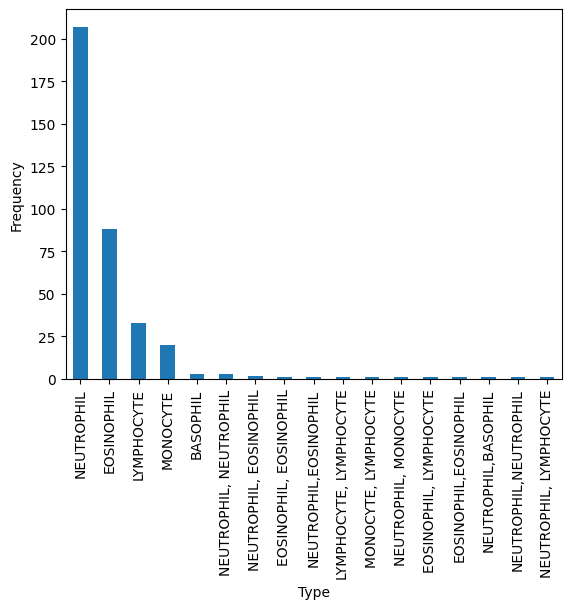

In [10]:
# Checking the category distribution
labels.Category.value_counts().plot.bar(xlabel = "Type", ylabel = "Frequency");

# 2. Data preprocessing and image datasets

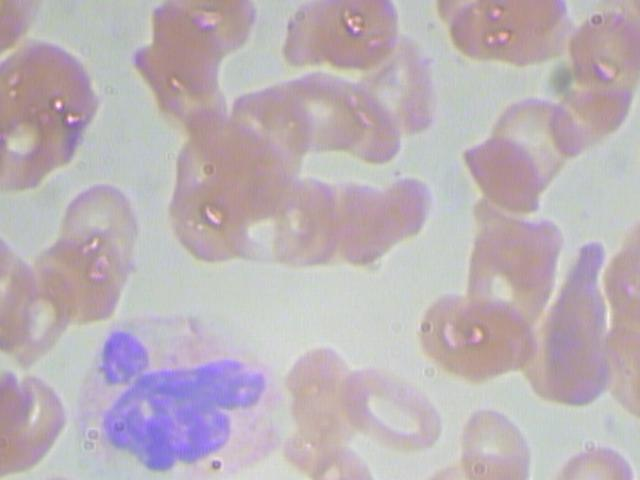

In [11]:
# Displaying an image
from IPython.display import Image
random_cell = Image("/content/drive/MyDrive/blood-type/dataset-master/dataset-master/JPEGImages/BloodImage_00001.jpg")
random_cell

In [12]:
def map_labels_to_filenames(labels_df):
    # Define the naming convention for image filenames
    image_prefix = "BloodImage_"
    image_extension = ".jpg"  # You can adjust the extension to match your image file format

    # Create a new column in the DataFrame to store the filenames
    labels_df['ImageFilename'] = labels_df['Image'].apply(lambda x: f"{image_prefix}{x:05d}{image_extension}")

    return labels_df

# Creating a new column with the correct filenames
labels = map_labels_to_filenames(labels)
labels

<ipython-input-12-f8813e54d574>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labels_df['ImageFilename'] = labels_df['Image'].apply(lambda x: f"{image_prefix}{x:05d}{image_extension}")


,Image,Category,ImageFilename
0,0,NEUTROPHIL,BloodImage_00000.jpg
1,1,NEUTROPHIL,BloodImage_00001.jpg
2,2,NEUTROPHIL,BloodImage_00002.jpg
3,3,NEUTROPHIL,BloodImage_00003.jpg
4,4,NEUTROPHIL,BloodImage_00004.jpg
...,...,...,...
404,405,NEUTROPHIL,BloodImage_00405.jpg
406,407,NEUTROPHIL,BloodImage_00407.jpg
407,408,NEUTROPHIL,BloodImage_00408.jpg
408,409,NEUTROPHIL,BloodImage_00409.jpg


In [13]:
# NumPy array of blood cell types
cell_type = labels.Category.to_numpy()
cell_type

array(['NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL',
       'NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL', 'BASOPHIL',
       'EOSINOPHIL', 'NEUTROPHIL, EOSINOPHIL', 'NEUTROPHIL', 'NEUTROPHIL',
       'NEUTROPHIL', 'NEUTROPHIL', 'MONOCYTE', 'NEUTROPHIL', 'EOSINOPHIL',
       'NEUTROPHIL', 'NEUTROPHIL', 'LYMPHOCYTE', 'LYMPHOCYTE',
       'NEUTROPHIL', 'EOSINOPHIL', 'NEUTROPHIL', 'EOSINOPHIL',
       'EOSINOPHIL', 'NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL,NEUTROPHIL',
       'NEUTROPHIL', 'NEUTROPHIL', 'NEUTROPHIL,BASOPHIL', 'NEUTROPHIL',
       'EOSINOPHIL', 'LYMPHOCYTE', 'LYMPHOCYTE', 'NEUTROPHIL', 'MONOCYTE',
       'EOSINOPHIL', 'EOSINOPHIL', 'NEUTROPHIL, MONOCYTE',
       'EOSINOPHIL,EOSINOPHIL', 'EOSINOPHIL', 'NEUTROPHIL', 'LYMPHOCYTE',
       'EOSINOPHIL', 'EOSINOPHIL', 'NEUTROPHIL', 'NEUTROPHIL',
       'NEUTROPHIL', 'LYMPHOCYTE', 'LYMPHOCYTE', 'EOSINOPHIL',
       'EOSINOPHIL', 'EOSINOPHIL', 'EOSINOPHIL', 'EOSINOPHIL',
       'NEUTROPHIL', 'EOSINOPHIL', 'NEUTROP

In [14]:
# Image filenames
filenames = ["/content/drive/MyDrive/blood-type/dataset-master/dataset-master/JPEGImages/" + fname for fname in labels.ImageFilename]
filenames[105]

'/content/drive/MyDrive/blood-type/dataset-master/dataset-master/JPEGImages/BloodImage_00115.jpg'

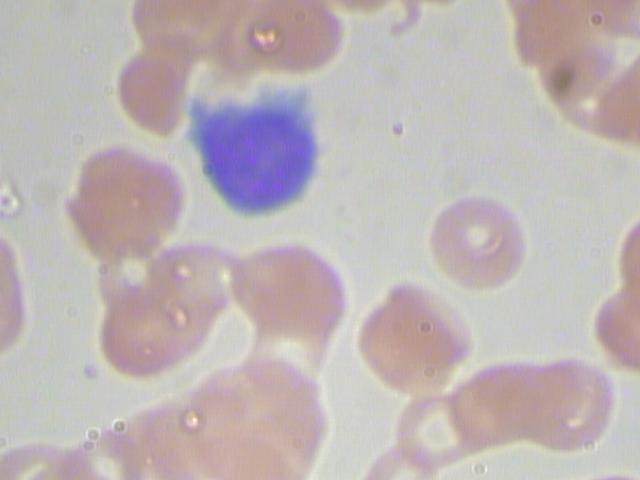

In [15]:
# Checking image from path
Image(filenames[106])

Now that the labels and filenames are equal in length and content, the next step is to convert those labels in numbers (more exactly 0 or 1, for True and
False).

In [16]:
unique_types = np.unique(cell_type)

In [17]:
# Turn every label into a boolean array
boolean_types = [type == np.array(unique_types) for type in cell_type]
boolean_types[:2] # Example

[array([False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False]),
 array([False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False])]

In [18]:
# Splitting data into training and test sets
X = filenames
y = boolean_types

In [19]:
# Making the splits
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Checking the length
len(X_train), len(X_val), len(y_train), len(y_val)

(292, 74, 292, 74)

In [20]:
# Image preprocessing function
IMG_SIZE = 224

def process_img(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels = 3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])
  return image

In [21]:
# Function to get the image path and its label
def img_label(image_path, label):
  image = process_img(image_path)
  return image, label

In [22]:
BATCH_SIZE = 32
# Function to create batch datasets
def create_batch(X, y = None, batch_size = BATCH_SIZE, test_data = False, valid_data = False):
 """
 Creates batches of data (X - image and y - label pairs). Shuffles the data if it's training data but not if it's validation data. Also accepts test data as input (no labels).
 """
 if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

 elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(img_label).batch(BATCH_SIZE)
    return data_batch

 else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))

 data = data.shuffle(buffer_size = len(X))
 data = data.map(img_label)
 data_batch = data.batch(BATCH_SIZE)
 return data_batch

In [23]:
# Creating training and validation data batches
train_data = create_batch(X_train, y_train)
val_data = create_batch(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


Since the batches have been successfully created, the next step is to visualize them. Let's start with 20 images.

In [24]:
# Create a function for viewing 20 images of a data batch
def show_20(images, labels):
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(20):
    ax = plt.subplot(5, 4, i+1)
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_types[labels[i].argmax()])
    plt.axis("off")

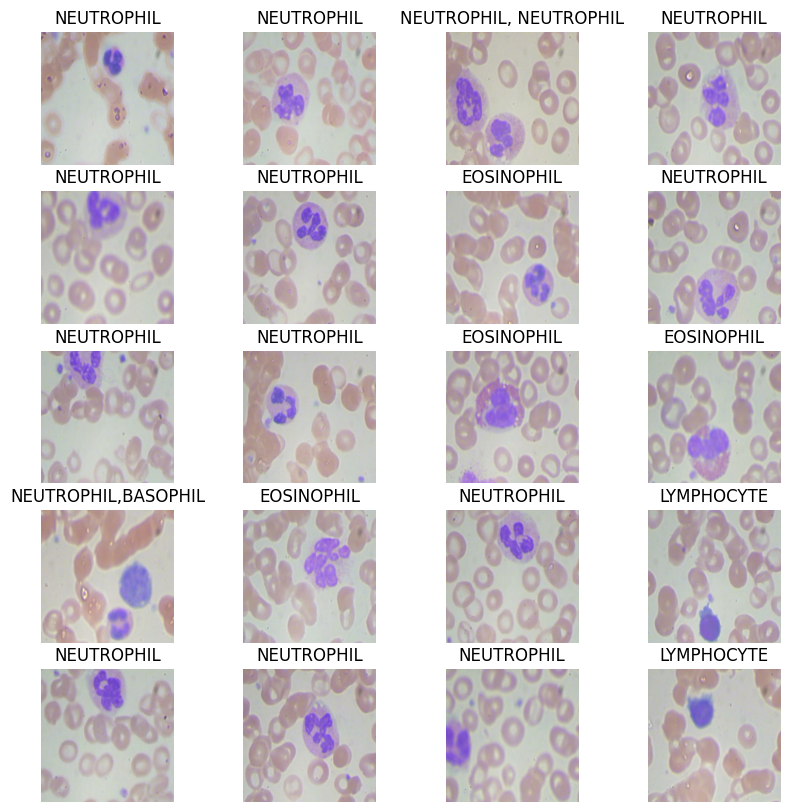

In [25]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator()) # We convert our data batches into iterables for unpacking
show_20(train_images, train_labels)

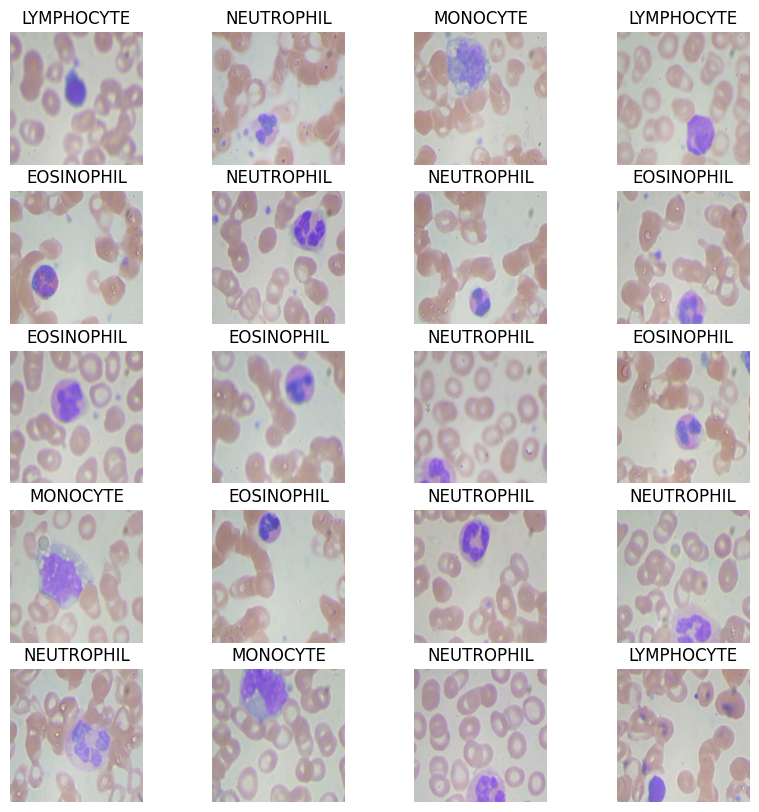

In [26]:
# Visualizing validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_20(val_images, val_labels)

# 3. Modelling

In [27]:
# Setting up inputs and outputs
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_types)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [28]:
# Function to create a Keras model
def create_keras_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):

   print("Building a model via:", MODEL_URL)

   model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
   ])

  # Compiling the model
   model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Reducing how wrong its guesses are
      optimizer=tf.keras.optimizers.Adam(), # Improving its guesses
      metrics=["accuracy"]
  )

  # Building the model
   model.build(INPUT_SHAPE)

   return model

In [29]:
model = create_keras_model()
model.summary()

Building a model via: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 17)                17034     
                                                                 
Total params: 5449747 (20.79 MB)
Trainable params: 17034 (66.54 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


Now that the model has been successfully built, the next step is to create some callback functions before training.

In [30]:
# 1. TensorBoard callback for time logs
%load_ext tensorboard
import datetime, os

# Create a function to build a TensorBoard callback
def tensorboard_callback():
  # Create a directory for storing logs
  logdir = os.path.join("/content/drive/My Drive/Data/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [31]:
# 2. Early Stopping callback to prevent the model from unnecessarily training if it's not improving
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

Now let's train the model.

In [32]:
# Build a function to train and return a trained model
def train():
  model = create_keras_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=100,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [33]:
model = train()

Building a model via: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
10/10 [==============================] - 39s 3s/step - loss: 2.0290 - accuracy: 0.3836 - val_loss: 2.1586 - val_accuracy: 0.4865
Epoch 2/100
10/10 [==============================] - 17s 2s/step - loss: 1.5853 - accuracy: 0.5411 - val_loss: 1.8438 - val_accuracy: 0.4595
Epoch 3/100
10/10 [==============================] - 18s 2s/step - loss: 1.3934 - accuracy: 0.5479 - val_loss: 1.8465 - val_accuracy: 0.5405
Epoch 4/100
10/10 [==============================] - 18s 2s/step - loss: 1.2326 - accuracy: 0.5582 - val_loss: 1.7511 - val_accuracy: 0.5541
Epoch 5/100
10/10 [==============================] - 16s 2s/step - loss: 1.1104 - accuracy: 0.6096 - val_loss: 1.7156 - val_accuracy: 0.5000
Epoch 6/100
10/10 [==============================] - 18s 2s/step - loss: 0.9980 - accuracy: 0.6301 - val_loss: 1.8906 - val_accuracy: 0.5405
Epoch 7/100
10/10 [==============================] - 19s 2s/

In [34]:
# TensorBoard logs
%tensorboard --logdir content/drive/My\ Drive/Data/logs

<IPython.core.display.Javascript object>

# 4. Making predictions on the model

In [35]:
preds = model.predict(val_data, verbose = 1)

3/3 [==============================] - 20s 741ms/step


In [36]:
preds

array([[9.9243857e-03, 3.5971856e-01, 8.1823976e-07, ..., 5.3979913e-03,
        4.1374085e-03, 1.3846171e-03],
       [7.7137356e-03, 2.4418624e-01, 6.2517671e-07, ..., 1.5087968e-03,
        2.4240375e-03, 3.5425581e-03],
       [1.0736570e-02, 4.7393003e-01, 2.4675509e-07, ..., 2.7104600e-03,
        3.3636105e-03, 7.4962233e-03],
       ...,
       [9.8503912e-03, 5.8647501e-01, 5.7551027e-08, ..., 3.5581023e-03,
        7.9912442e-04, 2.1278600e-03],
       [4.6431512e-02, 5.1798934e-01, 1.0542806e-07, ..., 2.7472372e-04,
        1.9132959e-02, 2.6272747e-03],
       [2.9433143e-04, 2.3632014e-01, 2.2137923e-08, ..., 5.0544164e-05,
        2.7415508e-03, 2.1691402e-04]], dtype=float32)

In [37]:
preds.shape

(74, 17)

In [38]:
# Function to turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  return unique_types[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(preds[0])
pred_label

'EOSINOPHIL'

In [39]:
# Function to unbatch a batched dataset
def unbatch(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_types[np.argmax(label)])
  return images, labels

# Unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.6936775 , 0.69759905, 0.6779912 ],
         [0.68395364, 0.6878752 , 0.6669468 ],
         [0.68679476, 0.6907163 , 0.6671869 ],
         ...,
         [0.6630251 , 0.56890744, 0.70224077],
         [0.65658265, 0.55854344, 0.71532625],
         [0.6607845 , 0.5588237 , 0.73897594]],
 
        [[0.6770308 , 0.6729092 , 0.6656663 ],
         [0.6689076 , 0.664986  , 0.654902  ],
         [0.6714286 , 0.66750705, 0.65310127],
         ...,
         [0.6550219 , 0.5530611 , 0.690316  ],
         [0.6481793 , 0.5459784 , 0.6949981 ],
         [0.6534215 , 0.5475392 , 0.7184075 ]],
 
        [[0.67222893, 0.6526611 , 0.6737495 ],
         [0.6672269 , 0.6455383 , 0.6595439 ],
         [0.66878754, 0.65070033, 0.657503  ],
         ...,
         [0.6535013 , 0.5476189 , 0.670308  ],
         [0.64705884, 0.54105645, 0.67338943],
         [0.6512607 , 0.54145676, 0.69163686]],
 
        ...,
 
        [[0.68347335, 0.6756302 , 0.6168067 ],
         [0.6872749 , 0.67943174, 0.62060

In [40]:
def plot_predictions(prediction_probabilities, labels, images, n=1):
  """
  For sample n, prediction, ground truth label and image are shown.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

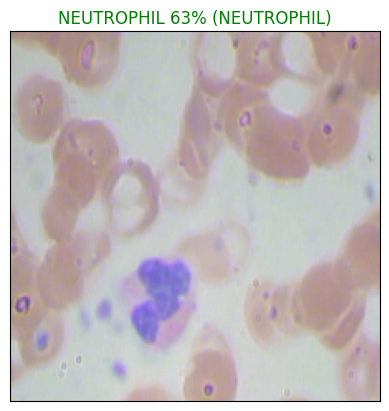

In [41]:
# Example
plot_predictions(prediction_probabilities=preds,
          labels=val_labels,
          images=val_images)

So it predicted the neutrophil blood cell type correctly, and it had a 66% chance of guessing it right. Let's make some more predictions.

In [42]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_types[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

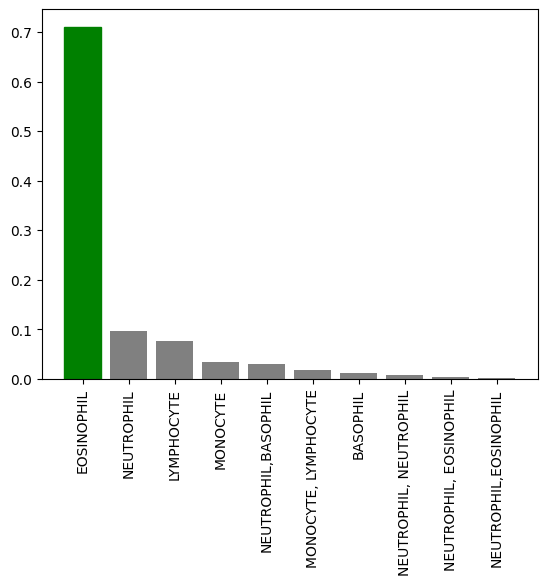

In [43]:
plot_pred_conf(prediction_probabilities=preds,
               labels=val_labels,
               n=9)

This means that the model is pretty good at guessing the eosinophil blood cell type with over 60% accuracy. Now let's visualize our predictions.

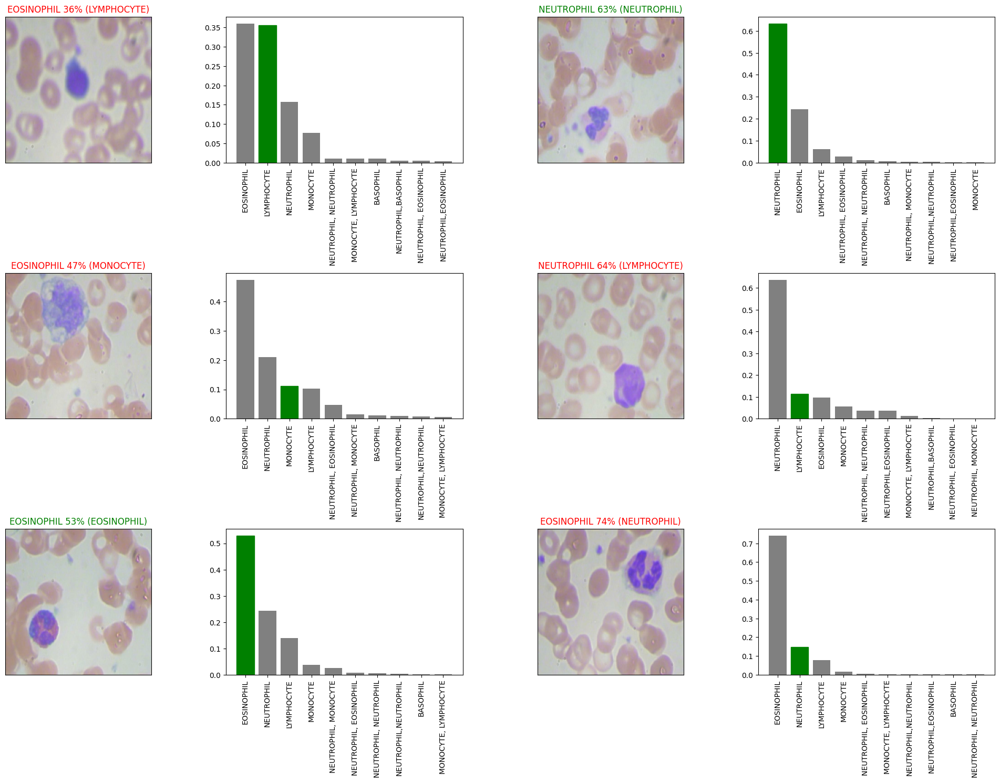

In [44]:
# Example
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_predictions(prediction_probabilities=preds,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=preds,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# 5. Saving and loading the model

In [45]:
def save_model(model, suffix=None):
  """
  Saves a given model in a given directory and appends a suffix for reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [46]:
# Saving the model
save_model(model, suffix="IMG_CL")

Saving model to: drive/My Drive/Data/models/20231108-09211699435269-IMG_CL.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20231108-09211699435269-IMG_CL.h5'

In [47]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [48]:
# Loading the trained model
trained_model = load_model("drive/My Drive/Data/models/20231107-16421699375375-IMG_CL.h5")

Loading saved model from: drive/My Drive/Data/models/20231107-16421699375375-IMG_CL.h5


In [49]:
# Evaluating the original model
model.evaluate(val_data)

3/3 [==============================] - 3s 734ms/step - loss: 1.7122 - accuracy: 0.5135


[1.7121992111206055, 0.5135135054588318]

In [50]:
# Evaluating the loaded model
trained_model.evaluate(val_data)

3/3 [==============================] - 4s 797ms/step - loss: 1.5356 - accuracy: 0.5811


[1.5356435775756836, 0.5810810923576355]

Not much of a difference.